In [1]:
import logging
import itertools

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn import metrics
from scipy import signal
import tqdm

import wldtools

In [2]:
logging.basicConfig(level=logging.INFO)
matplotlib.rcParams["image.cmap"] = 'gray' # 'hot'
rng = np.random.default_rng()

In [3]:
BLUE = '#1f77b4'
ORANGE = '#ff7f0e'
GREEN = '#2ca02c'
RED = '#d62728'
PURPLE = '#9467bd'
BROWN = '#8c564b'
PINK = '#e377c2'
GREY = '#7f7f7f'
OLIVE = '#bcbd22'
CYAN = '#17becf'
COLORS_RGB = [RED, GREEN, BLUE]

def show_rgb(image):
    fig, axs = plt.subplots(2, 3, figsize=(9, 6))
    axs[0, 0].imshow(image)
    axs[0, 0].set_title('original')

    axs[0, 1].imshow(image.mean(axis=2))
    axs[0, 1].set_title('mean')

    axs[0, 2].imshow(wldtools.make_grayscale(image))
    axs[0, 2].set_title('grayscale')

    axs[1, 0].imshow(image[:, :, 0])
    axs[1, 0].set_title('red')

    axs[1, 1].imshow(image[:, :, 1])
    axs[1, 1].set_title('green')

    axs[1, 2].imshow(image[:, :, 2])
    axs[1, 2].set_title('blue')
    plt.show()

def show_hist(image, range_=[0, 255]):
    hist_kwargs = dict(
        range = range_,
        alpha=0.4, 
        bins=20,
    )
    plt.hist(image.flatten(), color=GREY, **hist_kwargs)
    plt.hist(image[:, :, 0].flatten(), color=RED, **hist_kwargs)
    plt.hist(image[:, :, 1].flatten(), color=GREEN, **hist_kwargs)
    plt.hist(image[:, :, 2].flatten(), color=BLUE, **hist_kwargs)
    plt.show()

def show_excit_and_grad(image, *, excit_groups, group_bins, orientations, equalize=False):
    fig, axs = plt.subplots(2, 3, figsize=(10, 4))
    axs[0, 0].imshow(image)

    image = wldtools.make_grayscale(image)

    if equalize:
        image = wldtools.equalize_hist(image)

    diff_excit = wldtools.get_differential_excitation(image)
    grad_orien = wldtools.get_gradient_orientation(image, orientations)

    excit_range = [-np.pi/2, np.pi/2]
    counts, edges, ax = axs[0, 1].hist(diff_excit.flatten(),
                                       bins=excit_groups*group_bins,
                                       range=excit_range)
    orien_range = [0, 2*np.pi]
    axs[0, 2].hist(grad_orien.flatten(),
                   bins=orientations, range=orien_range)

    axs[1, 0].imshow(image)
    axs[1, 1].imshow(diff_excit)
    axs[1, 2].imshow(grad_orien)
    plt.show()

In [4]:
full_df = wldtools.full_df

In [5]:
full_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33126 entries, 0 to 33125
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   image_name                     33126 non-null  object 
 1   patient_id                     33126 non-null  object 
 2   sex                            33061 non-null  object 
 3   age_approx                     33058 non-null  float64
 4   anatom_site_general_challenge  32599 non-null  object 
 5   diagnosis                      33126 non-null  object 
 6   benign_malignant               33126 non-null  object 
 7   target                         33126 non-null  int64  
dtypes: float64(1), int64(1), object(6)
memory usage: 2.0+ MB


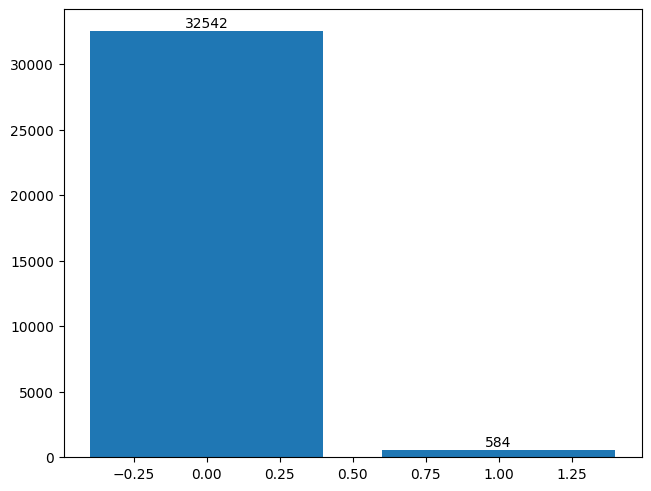

In [6]:
fig, ax = plt.subplots(layout='constrained')
target_counts = full_df.target.value_counts()
bars = ax.bar(target_counts.index, target_counts.values)
_ = ax.bar_label(bars)

In [7]:
positive = full_df.query('target == 1')
negative = full_df.query('target == 0').sample(n=positive.shape[0], random_state=42)
balanced_df = pd.concat([positive, negative])
balanced_df

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,diagnosis,benign_malignant,target
91,ISIC_0149568,IP_0962375,female,55.0,upper extremity,melanoma,malignant,1
235,ISIC_0188432,IP_0135517,female,50.0,upper extremity,melanoma,malignant,1
314,ISIC_0207268,IP_7735373,male,55.0,torso,melanoma,malignant,1
399,ISIC_0232101,IP_8349964,male,65.0,torso,melanoma,malignant,1
459,ISIC_0247330,IP_3232631,female,65.0,lower extremity,melanoma,malignant,1
...,...,...,...,...,...,...,...,...
12938,ISIC_3981425,IP_9124285,male,55.0,torso,unknown,benign,0
23717,ISIC_7199167,IP_0156057,female,60.0,lower extremity,unknown,benign,0
9364,ISIC_2906486,IP_5115535,male,40.0,head/neck,unknown,benign,0
20208,ISIC_6143791,IP_5064161,male,25.0,torso,unknown,benign,0


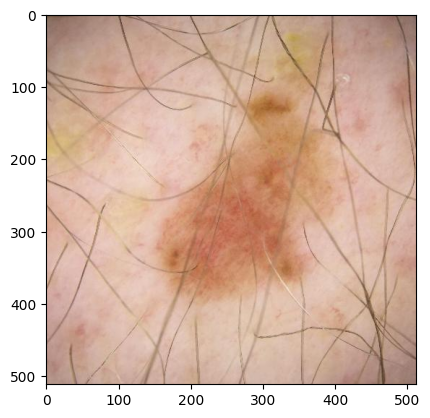

In [8]:
image_name = 'ISIC_4525317'
image = wldtools.get_image(image_name)
plt.imshow(image)

<BarContainer object of 960 artists>

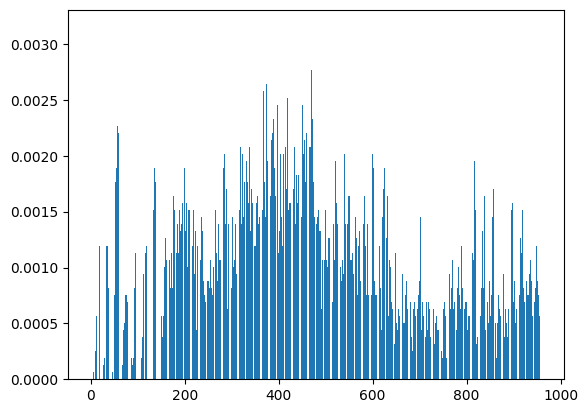

In [9]:
wld_kwargs = dict(side=128,
                  grayscale=True,
                  equalize=True,
                  excit_groups=6,
                  group_weights=(), #wldtools.WEIGHTS_PAPER,
                  group_bins=20,
                  orientations=8)

wld = wldtools.get_wld_histogram(image_name, **wld_kwargs)
plt.bar(range(len(wld)), wld)

In [10]:
df = balanced_df

targ = df.target
feat = np.array([wldtools.get_wld_histogram(name, **wld_kwargs)
    for name in tqdm.tqdm(df.image_name)
])

100%|██████████| 1168/1168 [00:26<00:00, 43.56it/s]


In [11]:
knn = KNeighborsClassifier(n_neighbors=3, metric=wldtools.histogram_distance)

feat_train, feat_test, targ_train, targ_test = (
    train_test_split(feat, targ, test_size=0.5, random_state=42))
knn.fit(feat_train, targ_train)

pred_train = knn.predict(feat_train)
print(f'{metrics.balanced_accuracy_score(targ_train, pred_train)=}')
print(metrics.confusion_matrix(targ_train, pred_train))

pred_test = knn.predict(feat_test)
print(metrics.balanced_accuracy_score(targ_test, pred_test))
print(metrics.confusion_matrix(targ_test, pred_test))

def show_samples(targ, pred):
    tn_bools = ((targ_test == targ).values & (pred_test == pred))

    print(f'{tn_bools.shape, tn_bools.sum()=}')

    image_names = df.loc[targ_test[tn_bools].index, :].image_name.sample(9)

    fig, axs = plt.subplots(2, 4, figsize=(12, 6))
    for idx, image_name in zip(itertools.product([0,1], [0,1,2,3]), image_names):
        axs[idx].imshow(wldtools.get_image(image_name))
        axs[idx].set_title(image_name)

metrics.balanced_accuracy_score(targ_train, pred_train)=0.8364710029966509
[[261  44]
 [ 51 228]]
0.6609789059286679
[[206  73]
 [127 178]]


tn_bools.shape, tn_bools.sum()=((584,), 206)


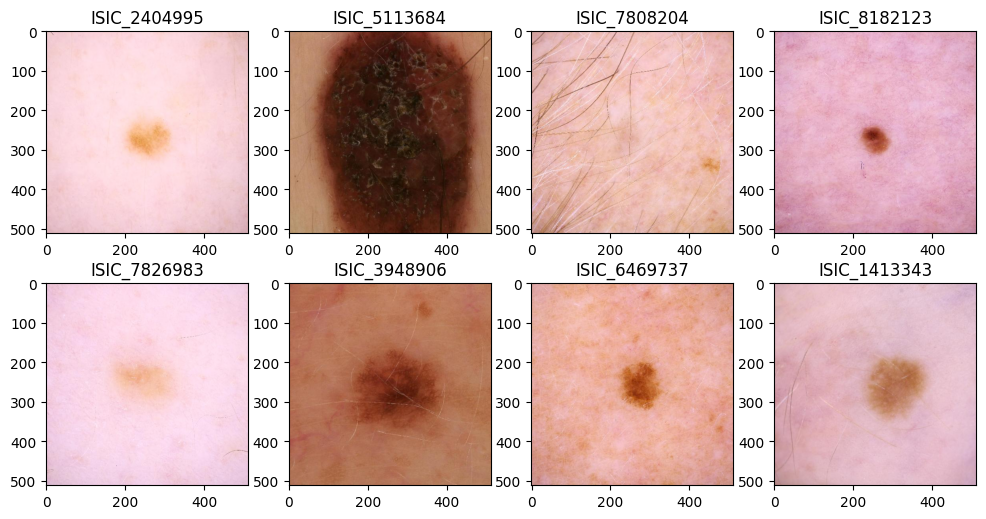

In [12]:
show_samples(targ=0, pred=0)

tn_bools.shape, tn_bools.sum()=((584,), 73)


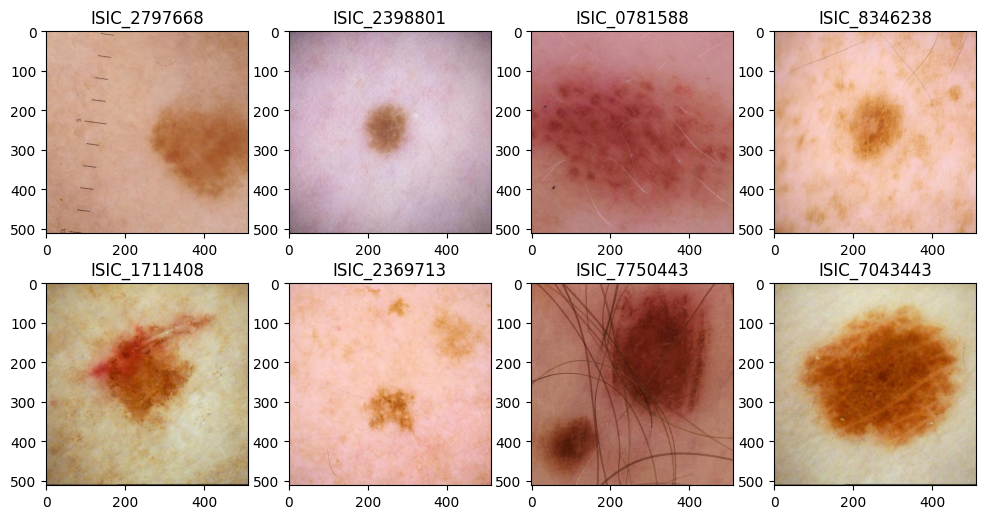

In [13]:
show_samples(targ=0, pred=1)

tn_bools.shape, tn_bools.sum()=((584,), 127)


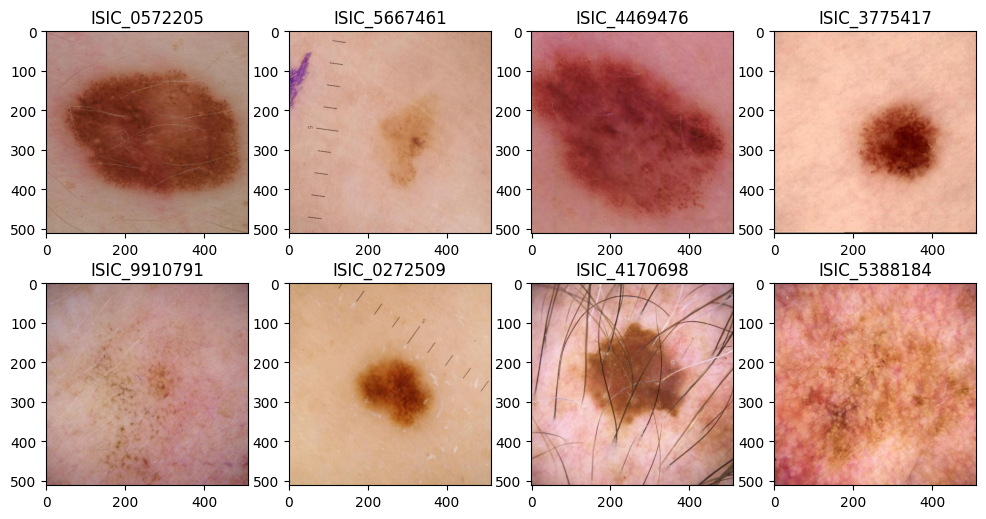

In [14]:
show_samples(targ=1, pred=0)

tn_bools.shape, tn_bools.sum()=((584,), 178)


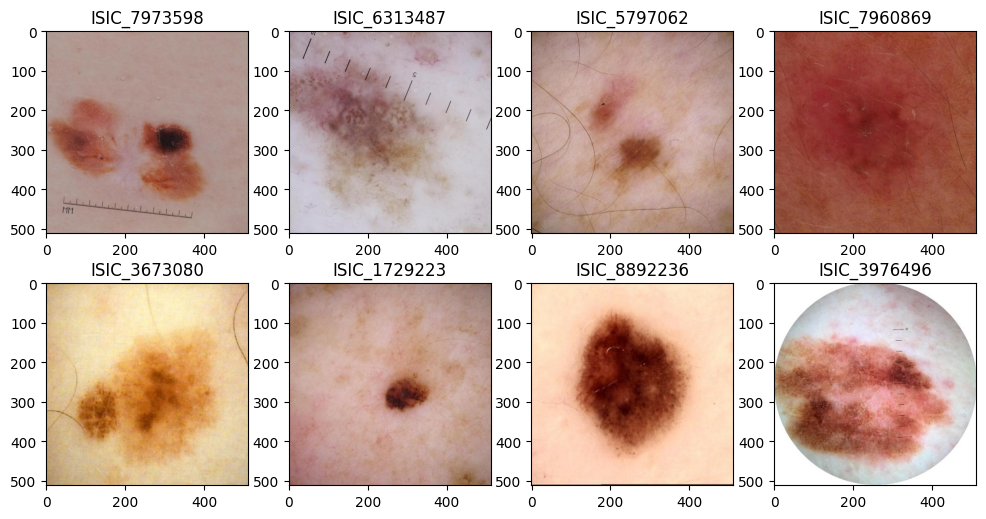

In [15]:
show_samples(targ=1, pred=1)

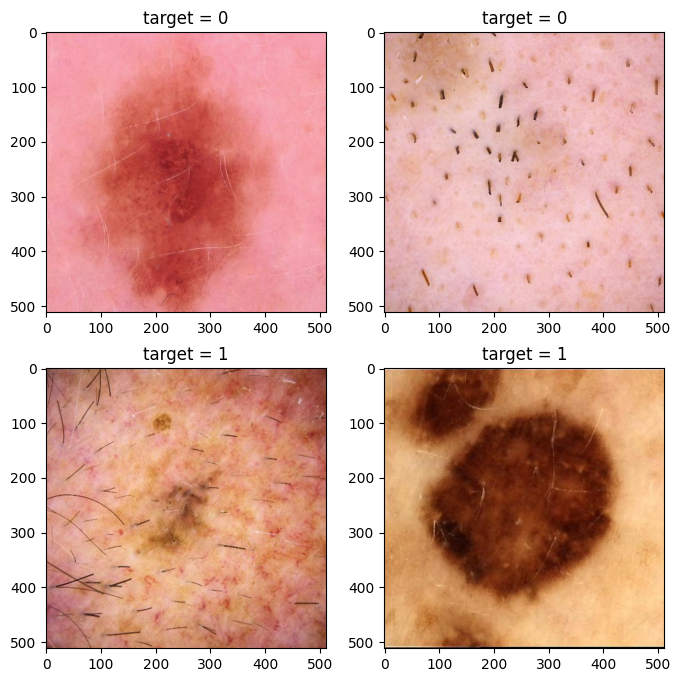

In [16]:
#image_name = 'ISIC_4525317'
names = np.array([
    ['ISIC_4432269', 'ISIC_3743446'],
    ['ISIC_3343475', 'ISIC_5869480'],
])
images = []

fig, axs = plt.subplots(2,2, figsize=(8, 8))
for idx in itertools.product([0,1], repeat=2):
    image = wldtools.get_image(names[idx])
    images.append(image)
    axs[idx].imshow(image)
    axs[idx].set_title(f'target = {full_df[full_df.image_name == names[idx]].target.item()}')

In [17]:
def show_overview_and_get_wld(image_name):
    wld_kwargs = dict(side=128,
                      grayscale=True,
                      equalize=True,
                      excit_groups=6,
                      # group_weights=wldtools.WEIGHTS_PAPER,
                      group_weights=(),
                      group_bins=20,
                      orientations=8)

    image = wldtools.get_image(image_name)
    image = wldtools.resize_image(image, side=wld_kwargs['side'])
    show_rgb(image)

    equalized = np.array([wldtools.equalize_hist(image[:, :, dim])
                         for dim in range(3)
                         ]).transpose(1, 2, 0)
    show_hist(image)
    show_rgb(equalized)
    show_hist(equalized, range_=None)

    show_excit_and_grad(image, excit_groups=wld_kwargs['excit_groups'],
                        group_bins=wld_kwargs['group_bins'],
                        orientations=wld_kwargs['orientations'])

    show_excit_and_grad(image, excit_groups=wld_kwargs['excit_groups'],
                        group_bins=wld_kwargs['group_bins'],
                        orientations=wld_kwargs['orientations'],
                        equalize=True)

    show_excit_and_grad(equalized, excit_groups=wld_kwargs['excit_groups'],
                        group_bins=wld_kwargs['group_bins'],
                        orientations=wld_kwargs['orientations'])

    wld = wldtools.get_wld_histogram(image_name, **wld_kwargs)
    plt.bar(range(len(wld)), wld)
    plt.show()
    return wld

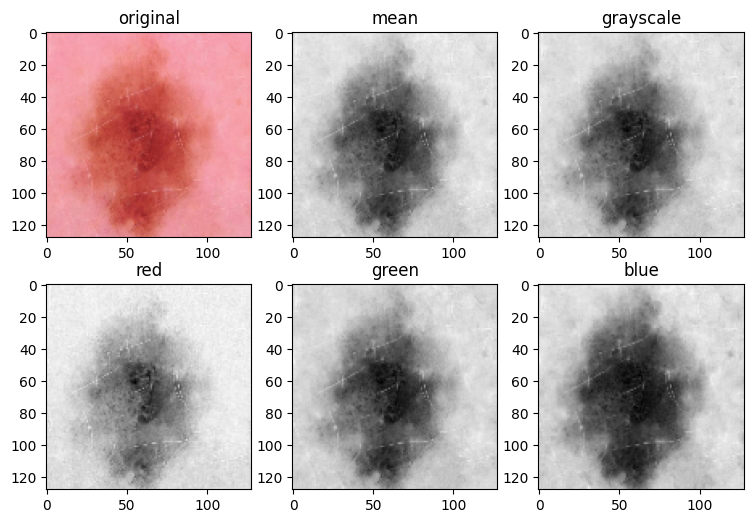

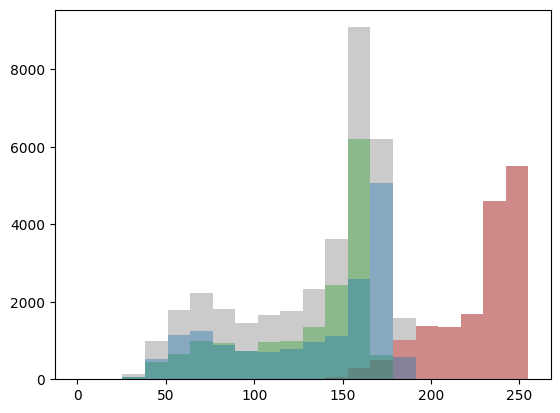

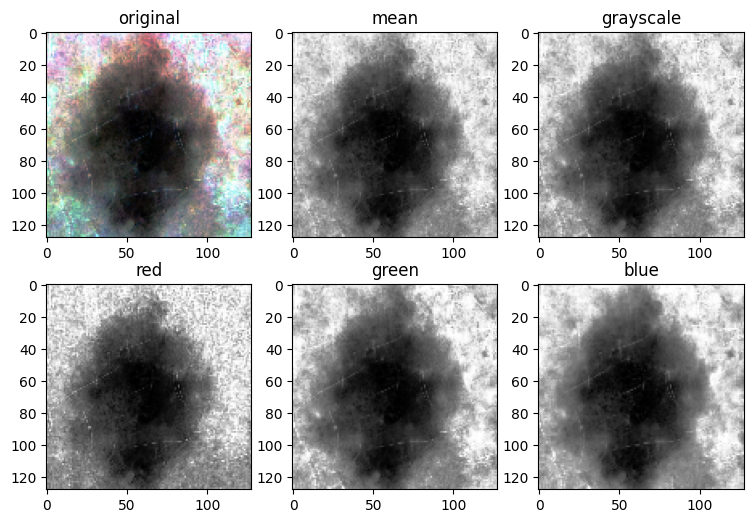

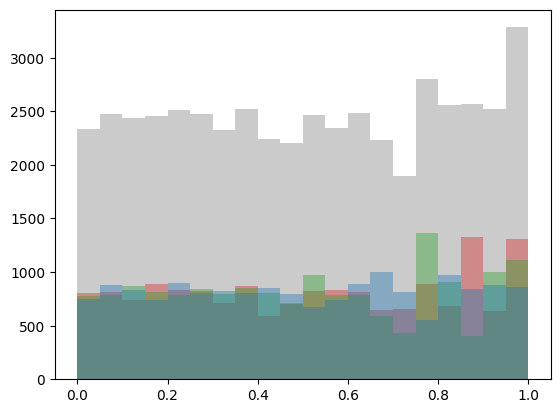

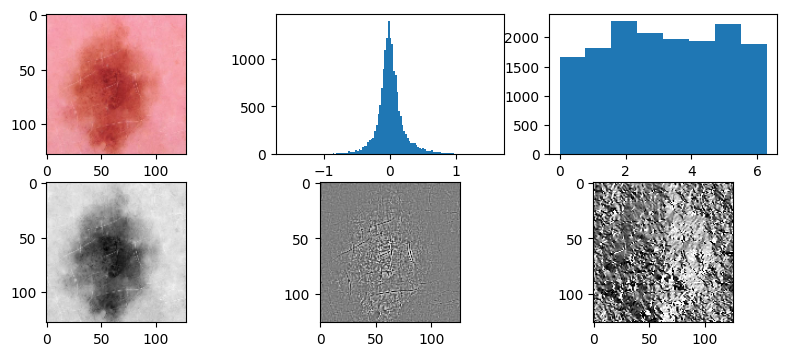

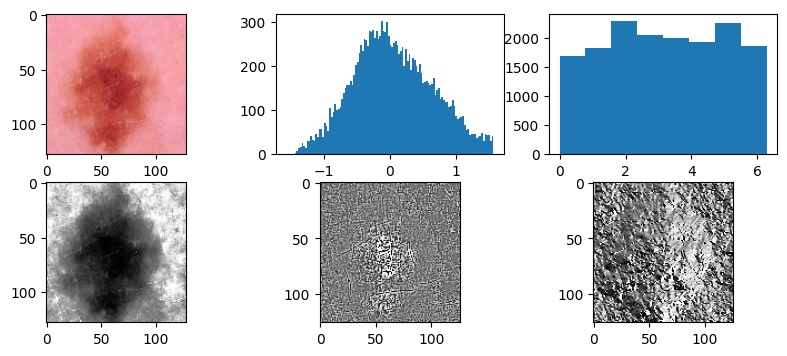

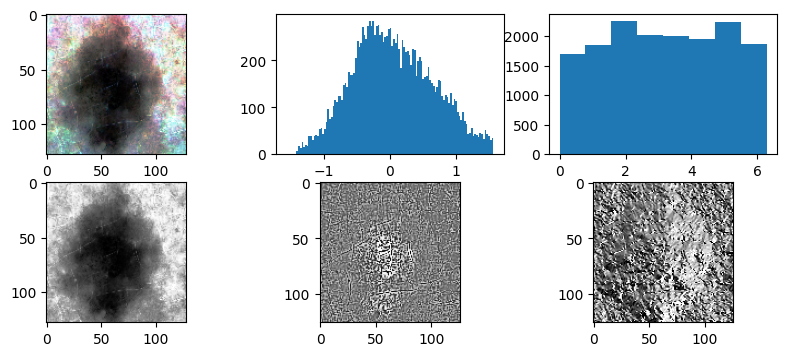

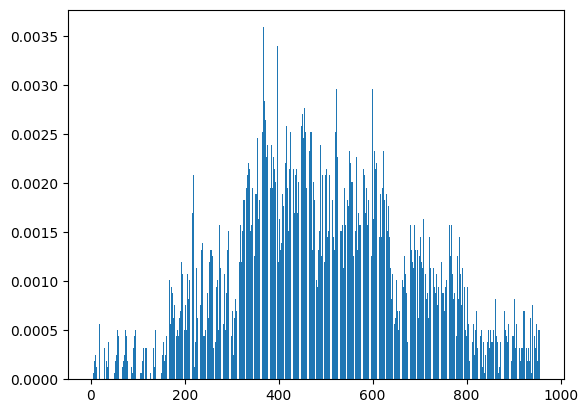

In [18]:
wld00 = show_overview_and_get_wld(names[0, 0])

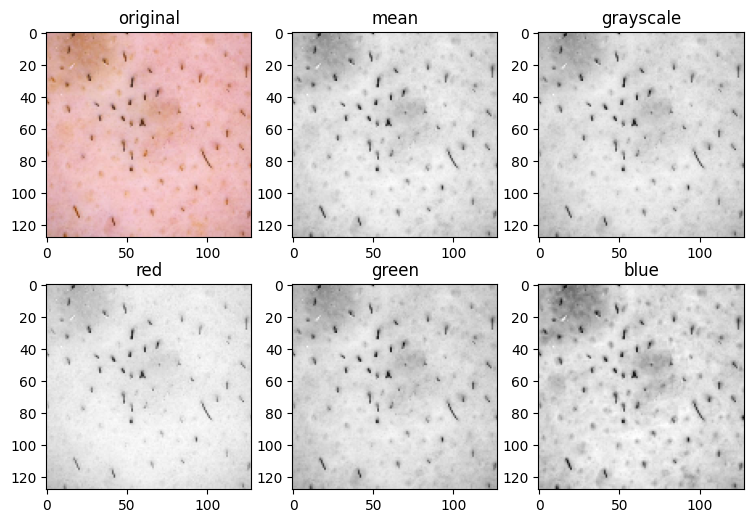

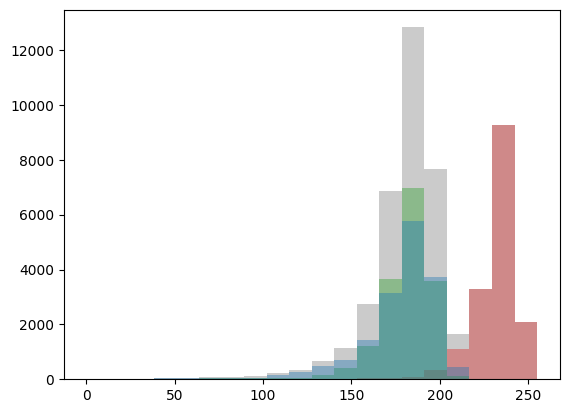

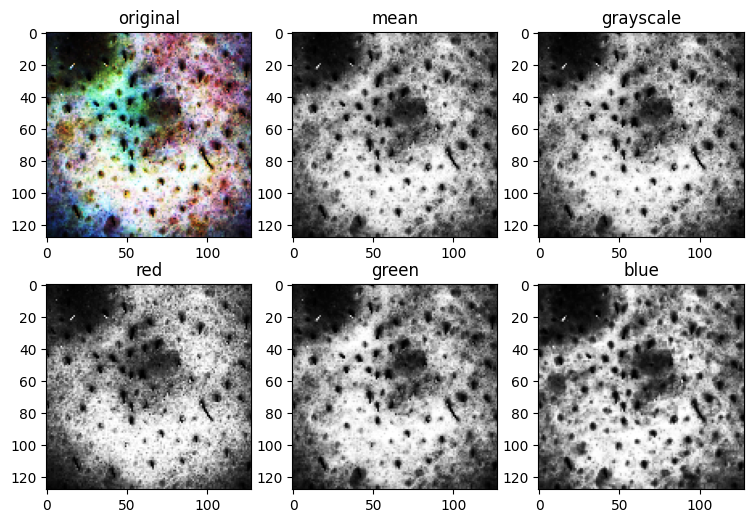

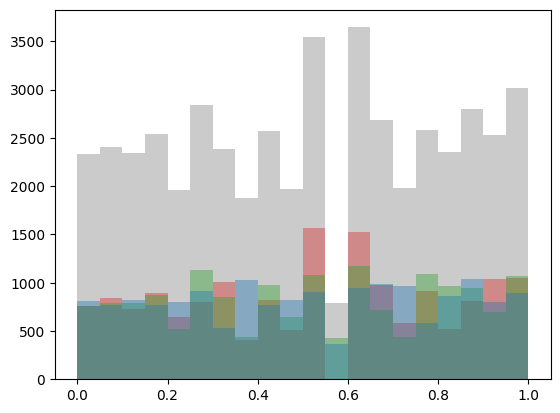

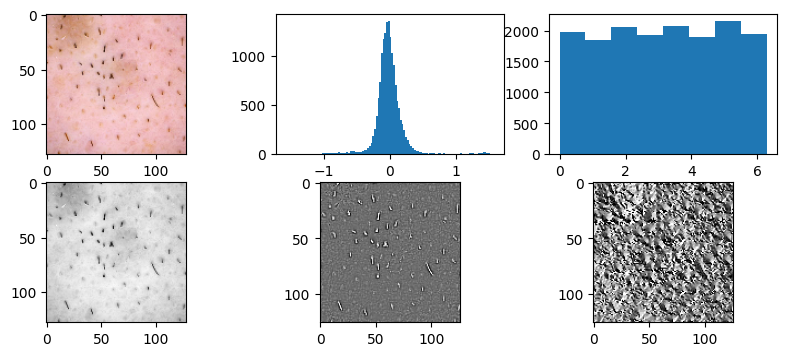

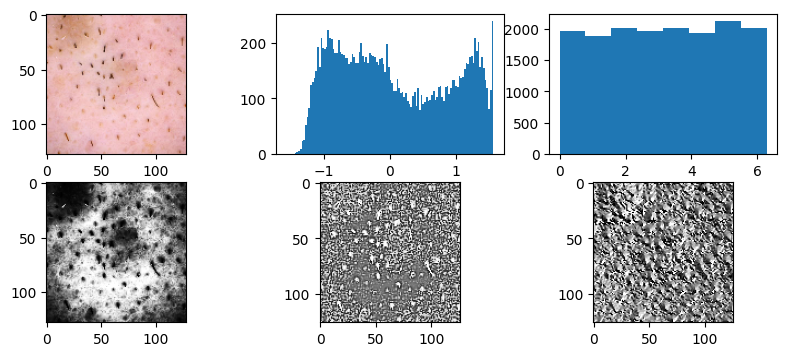

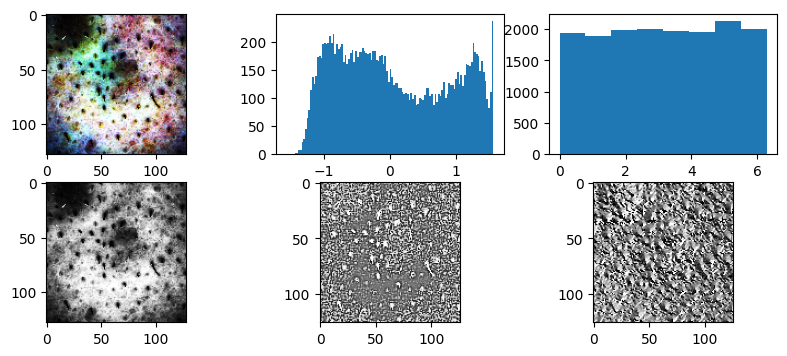

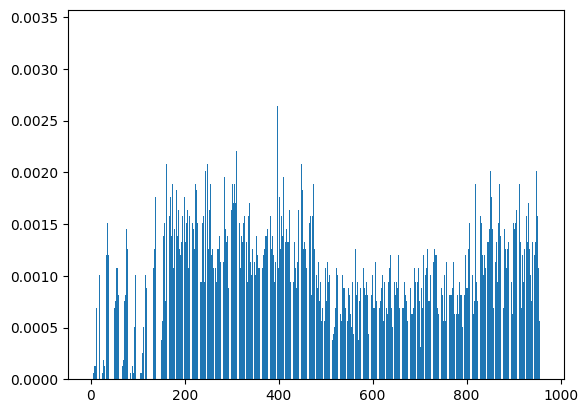

In [19]:
wld01 = show_overview_and_get_wld(names[0,1])

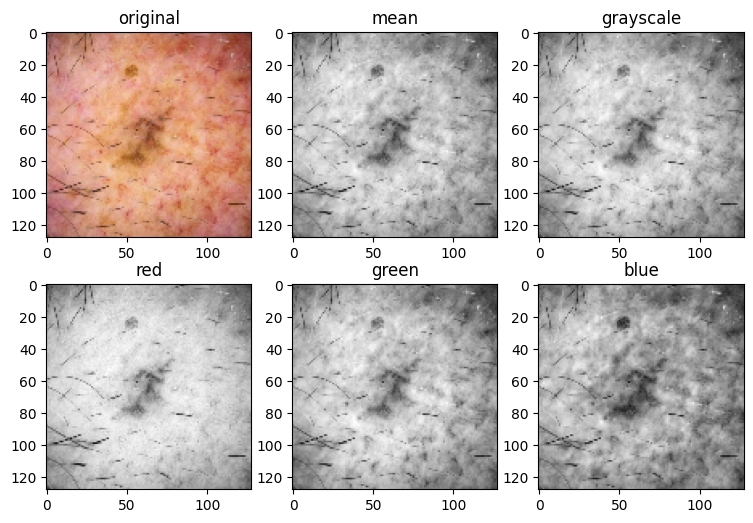

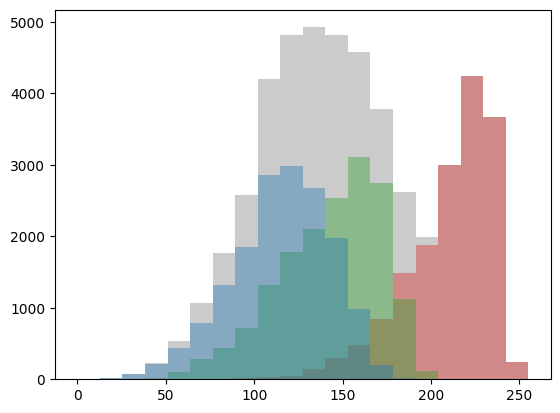

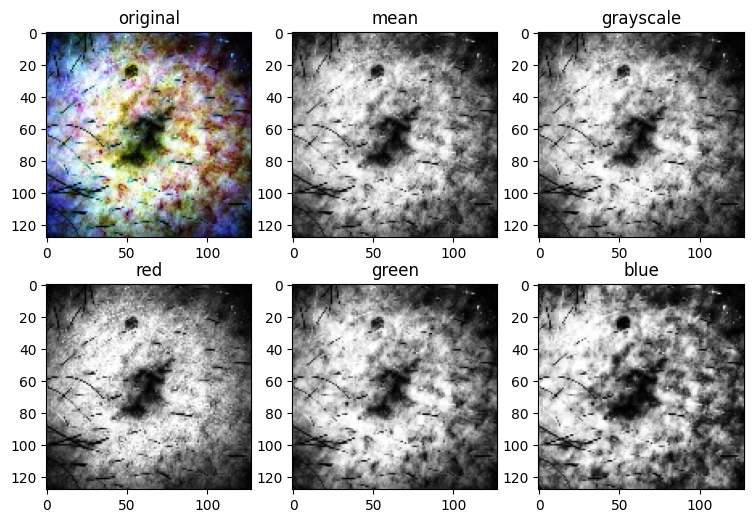

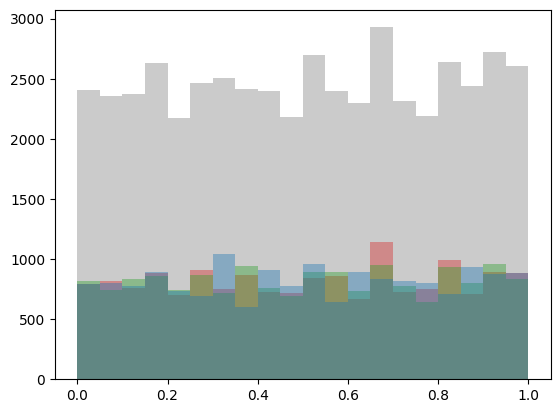

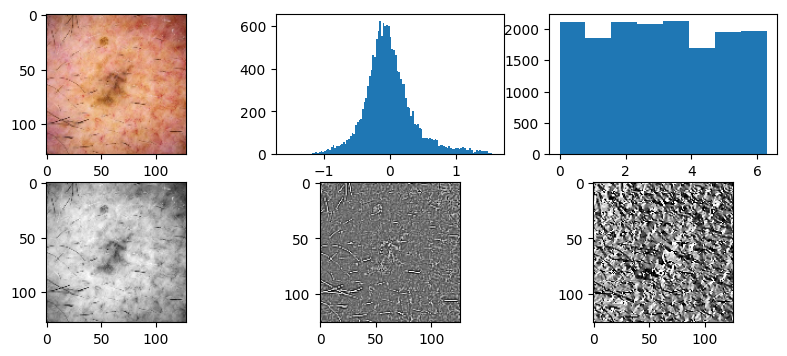

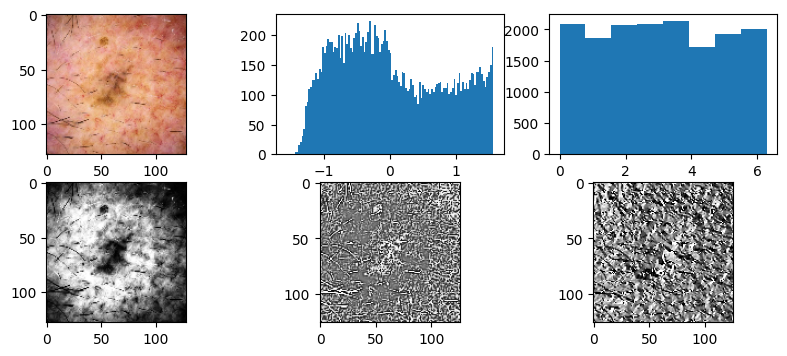

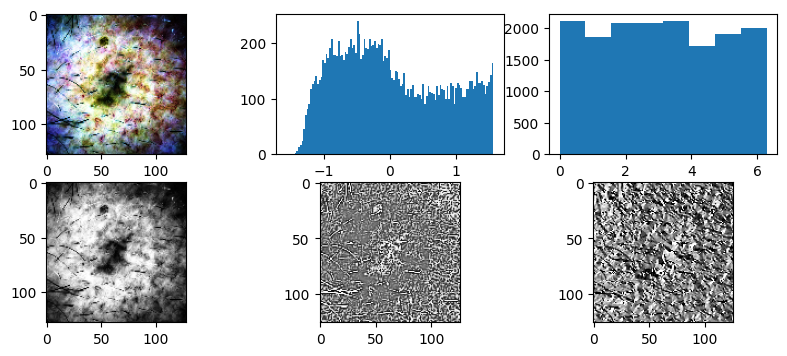

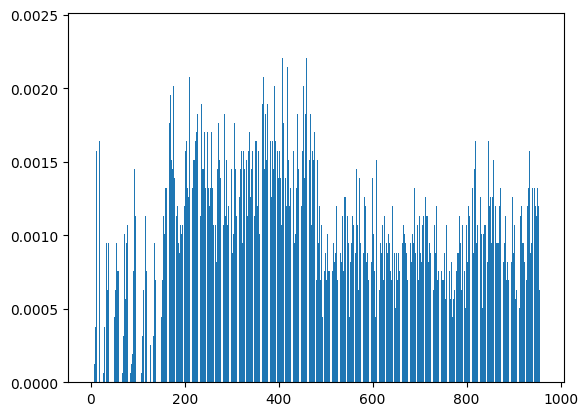

In [20]:
wld10 = show_overview_and_get_wld(names[1, 0])

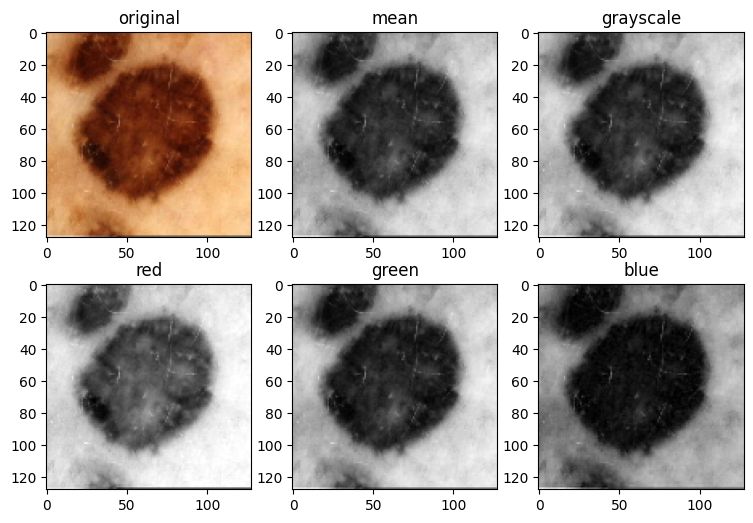

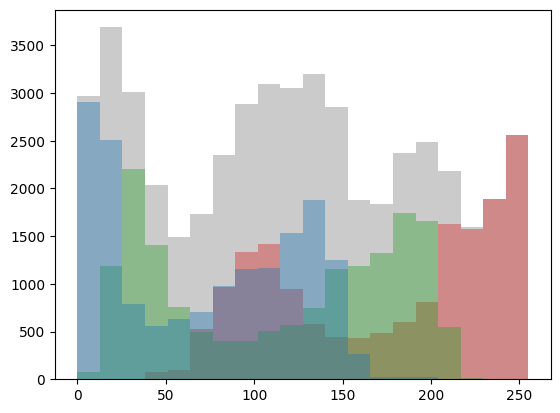

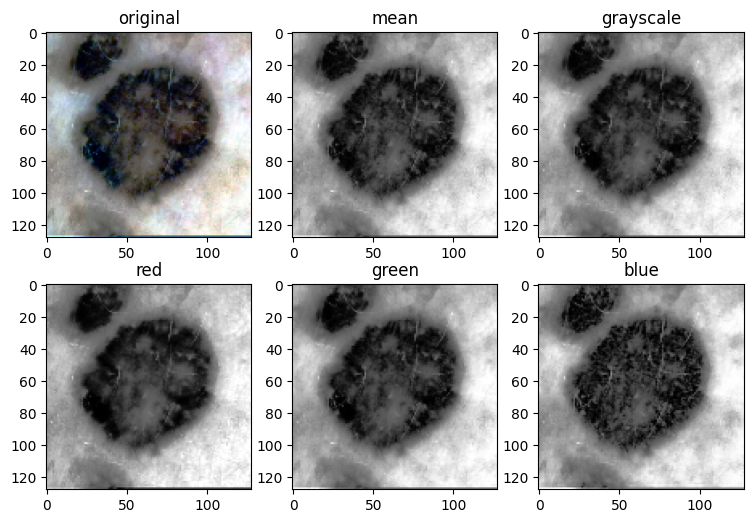

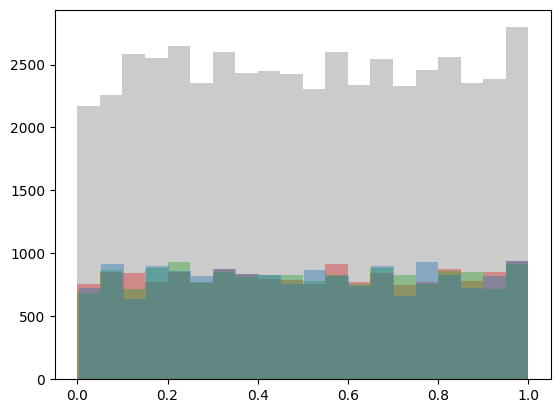

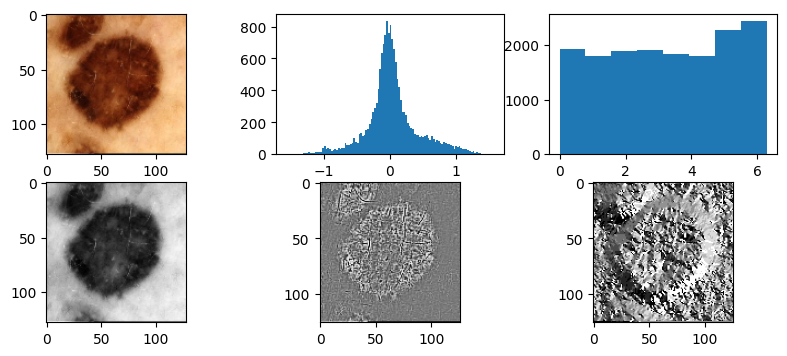

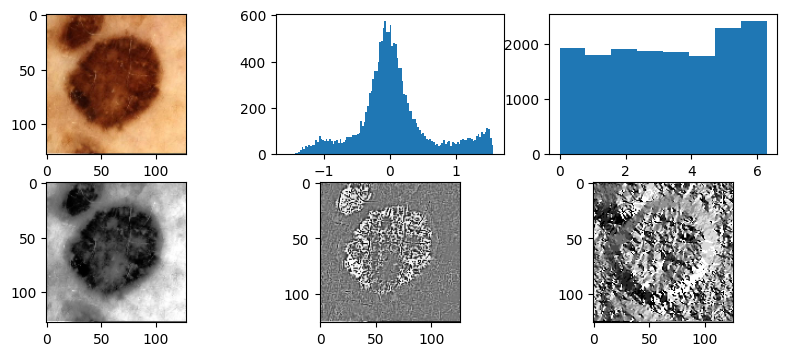

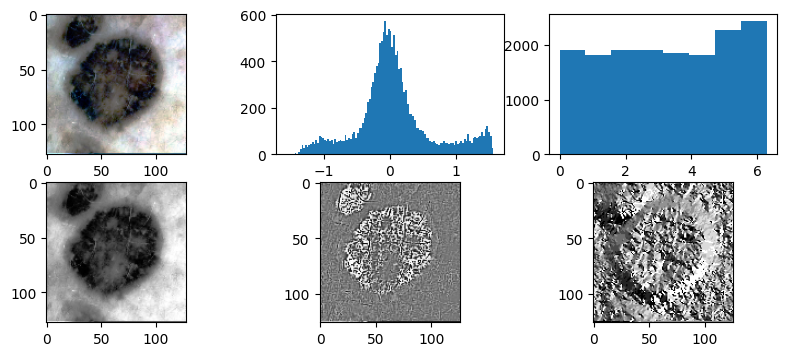

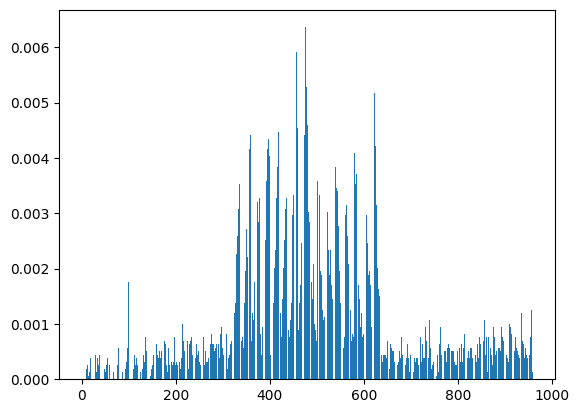

In [21]:
wld11 = show_overview_and_get_wld(names[1,1])

In [22]:
wlds = itertools.product([wld00, wld01, wld10, wld11], repeat=2)
lbls = itertools.product(['00', '01', '10', '11'], repeat=2)
rows = []
for (wld_a, wld_b), (lbl_a, lbl_b) in zip(wlds, lbls):
    dist = wldtools.histogram_distance(wld_a, wld_b)
    rows.append({'A': lbl_a, 'B': lbl_b, 'dist': dist})

In [23]:
pd.DataFrame(rows).sort_values('dist')#.stack()# .unstack()

,A,B,dist
0,00,00,0.000000
5,01,01,0.000000
10,10,10,0.000000
15,11,11,0.000000
6,01,10,0.148841
9,10,01,0.148841
2,00,10,0.263668
8,10,00,0.263668
3,00,11,0.282376
12,11,00,0.282376


array([[0.e+00, 0.e+00, 0.e+00],
       [1.e-05, 0.e+00, 0.e+00],
       [0.e+00, 1.e+00, 0.e+00]])

array([[-1.e-05]])

array([[-1.]])

-3.1415826535897935

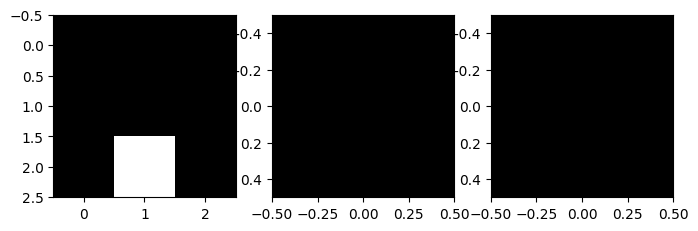

In [24]:
# Convolution Tests

arr = np.array([
    [  0,   0,   0,   0],
    [ 32,  64,  96,  128],
    [100,   1, 100,   1],
    # [255, 255, 255, 255],
])
arr = np.arange(9).reshape(3,3) * 9
arr = np.arange(16).reshape(4,4) * 16
arr = arr[::1, ::1]

# [1,  0,  0],     # [0,  0,  0],
# [0,  0,  0], --> # [0,  0,  0],
# [0,  0,  0]]     # [0,  0,  1]]))

# [0,  1,  0],     # [0,  0,  0],
# [0,  0,  0], --> # [0,  0,  0],
# [0,  0,  0]]     # [0,  1,  0]]))

# [0,  0,  1],     # [0,  0,  0],
# [0,  0,  0], --> # [0,  0,  0],
# [0,  0,  0]]     # [1,  0,  0]]))

# [0,  0,  0],     # [0,  0,  0],
# [1,  0,  0], --> # [0,  0,  1],
# [0,  0,  0]]     # [0,  0,  0]]))

# [0,  0,  0],     # [0,  0,  0],
# [0,  1,  0], --> # [0,  1,  0],
# [0,  0,  0]]     # [0,  0,  0]]))

arr = np.array([[0,  0,  0],
                [0.00001,  0,  0],
                [0,  1,  0]])
                
                
f10 = np.array([[0, -1,  0],
                [0,  0,  0],
                [0,  1,  0]])

f11 = np.array([[0,  0,  0],
                [1,  0, -1],
                [0,  0,  0]])

arr_10 = signal.convolve2d(f10, arr, mode='valid')
arr_11 = signal.convolve2d(f11, arr, mode='valid')

fig, axs = plt.subplots(1, 3, figsize=(8, 4))
axs[0].imshow(arr)
axs[1].imshow(arr_10)
axs[2].imshow(arr_11)

display(arr)
display(arr_11)
display(arr_10)
display(np.arctan2(arr_11[0, 0], arr_10[0,0]))